In [3]:
%load_ext autoreload
%autoreload 2
import sys
from pathlib import Path
import pandas as pd

sys.path.append("..")
from src import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
dataset = ObjaverseDataset3D()
views = 2

In [5]:
TESTSET_DIR = Path("dataset/test")
REND_DIR = Path("renderings")
dirs = [
    "gt",
    "sd15_mlsd",
    "sd15_ours",
    "sdxl_ours",
    "sdxl_mlsd_llite",
    "sdxl_ours_llite",
]
testset = pd.read_json(TESTSET_DIR / "metadata.jsonl", orient="records", lines=True)
testset.index = pd.Series(testset.uv_file_name.map(lambda x: Path(x).stem), name="uid")

Use `generate_renderings.py` to generate the renderings.

a cardboard box with a rough, textured surface, featuring a mix of beige and brown tones. it has a rectangular shape with a flat top and a slightly curved bottom. the box is marked with various symbols and text, including a caution sign and a warning about the contents.


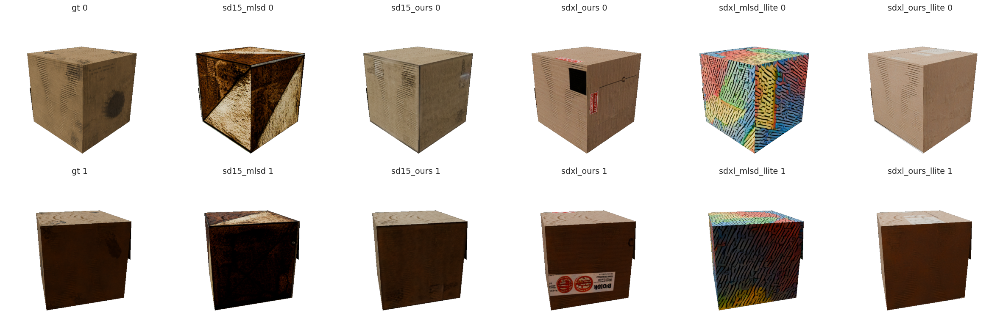

a modern, sleek wooden cabinet with a metallic frame, featuring a rich, dark wood grain and a contrasting red splatter design on the front panel.


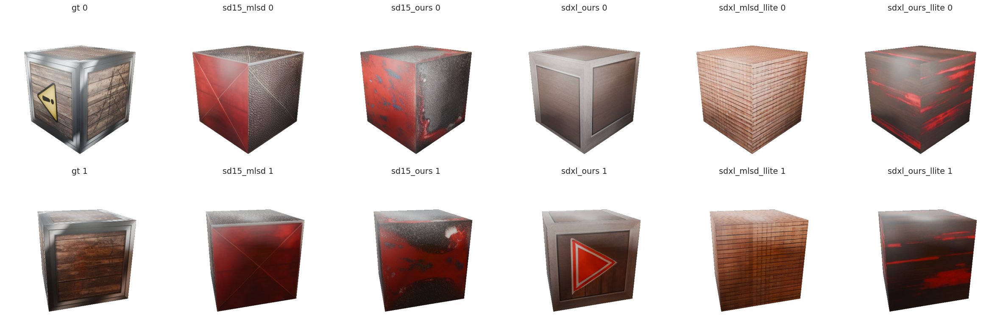

a vibrant turquoise card with a floral design, featuring a large image of pink and purple flowers with green foliage, and smaller images of the same flowers on the corners.


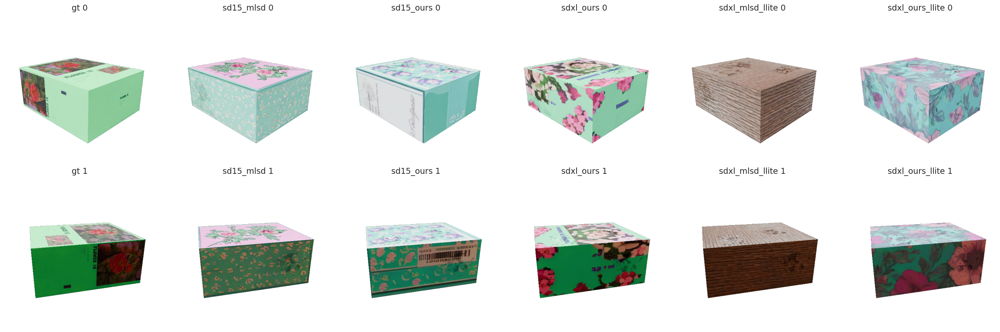

a weathered wooden chest with a distressed white finish, featuring a rustic texture and a single metal latch on the front.


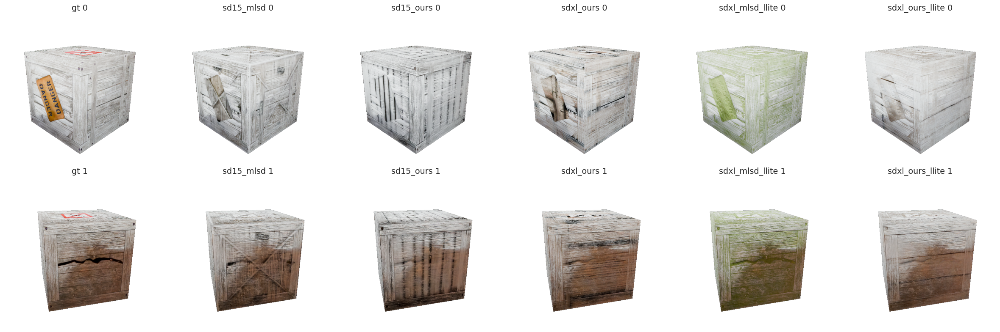

a 3d rendered image of a box with a black and orange color scheme. the box has a smooth texture with a glossy finish. the top of the box is orange with a gradient effect, while the rest of the box is black. the text on the box is white and appears to be in c


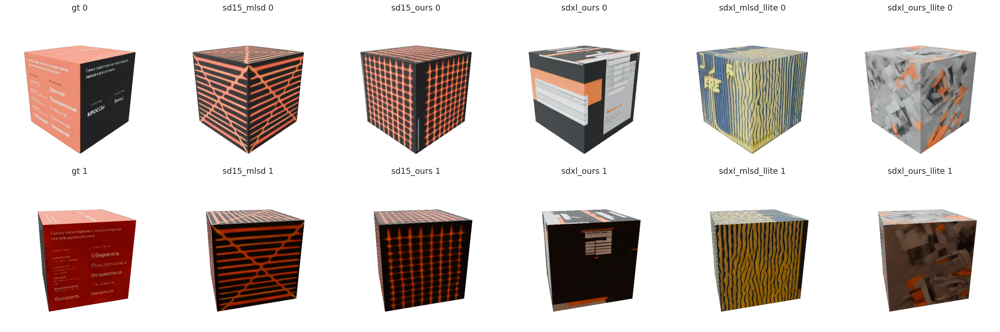

a black and yellow striped barrier with a smooth texture and metallic sheen, designed to be highly visible and durable.


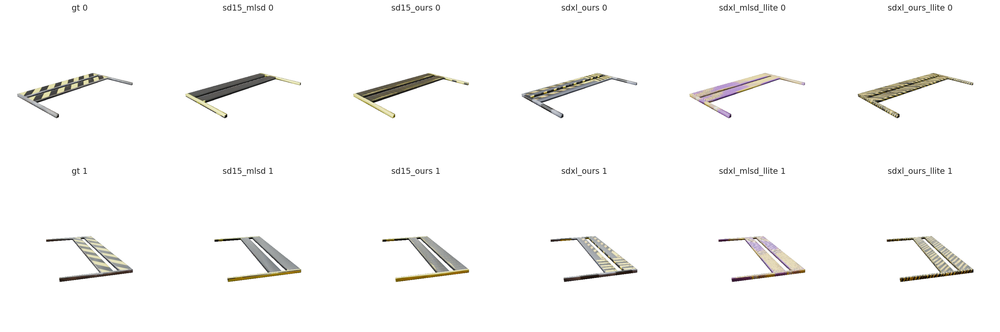

a wooden box with a red and white fragile label, indicating it should be handled with care. the wood has a natural, textured finish with visible grain patterns and a warm, brown color.


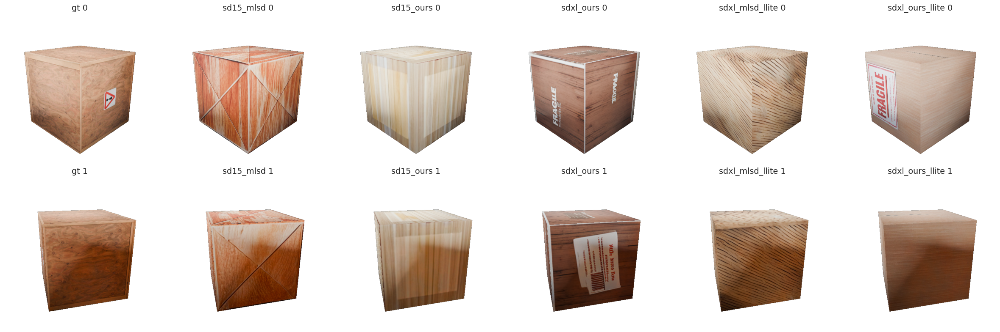

a wooden coffee table with a smooth, polished top and four sturdy legs, featuring a rich, warm brown color with a subtle grain pattern.


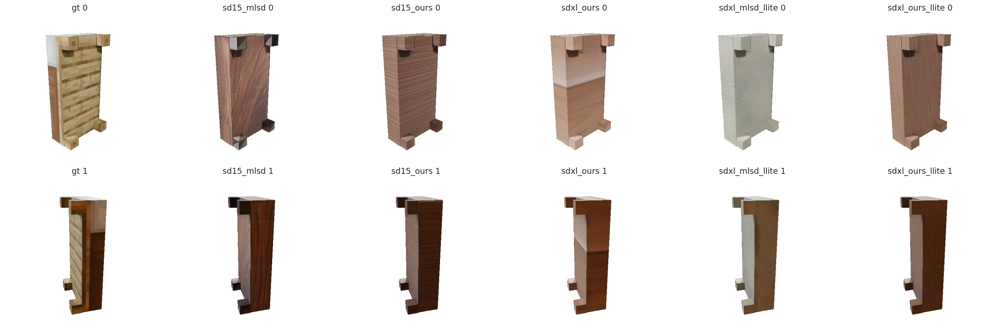

a cylindrical wooden stool with a natural, rough bark texture and a light brown color, featuring a smooth, flat wooden top.


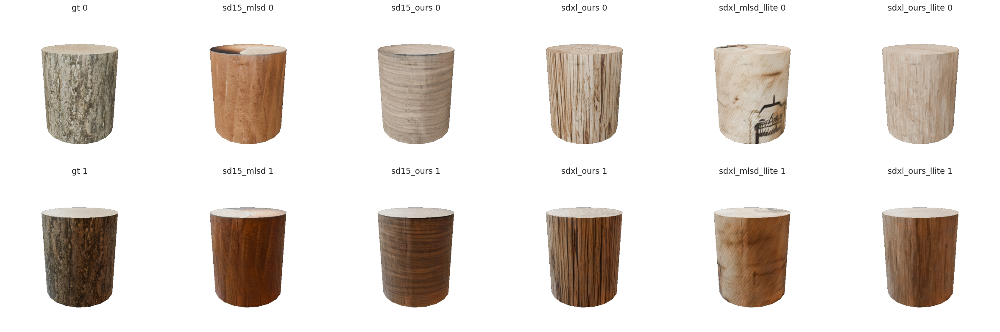

a vibrant green, smooth, and cylindrical object with a pointed top, possibly made of a matte plastic or ceramic material.


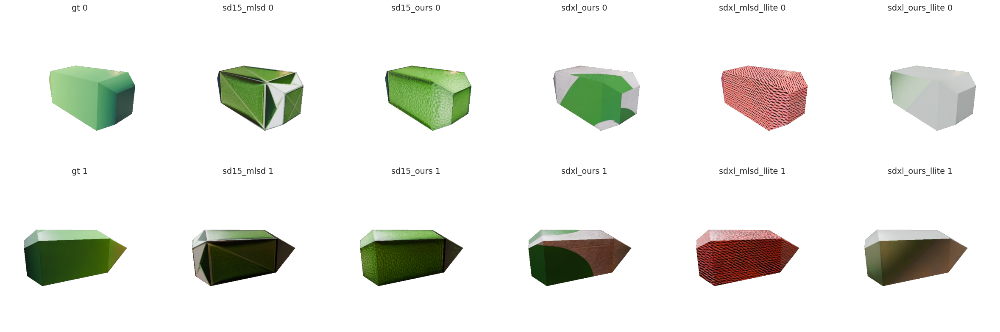

In [7]:
for uid in pd.Series(testset.index).sample(10):
    cprint(f"green:{testset.caption[uid]}")
    imshow(
        images={
            f"{dir} {view}": REND_DIR / dir / f"{uid.split('_')[0]}_{view}.png" for view in range(views) for dir in dirs 
        },
        size=4,
        cols=len(dirs),
    )